# start

## import

In [1]:
import geopandas as gpd
from typing import Union
from shapely.geometry import (
    Point, LineString, MultiLineString,
    Polygon, MultiPolygon, GeometryCollection,
    MultiPoint
)

import os
import numpy as np
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import KMeans
from typing import List
from shapely.validation import make_valid
from IPython.display import display
import folium
import hdbscan
from pyproj import Transformer
from shapely import convex_hull
from shapely.ops import unary_union
from shapely import union_all
from sklearn.cluster import DBSCAN
from shapely.ops import split
from shapely import ops
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

In [2]:
from blocksnet.blocks.cutting import preprocess_urban_objects
from blocksnet.blocks.cutting import cut_urban_blocks
from blocksnet.machine_learning.classification import BlocksClassifier
from blocksnet.blocks.cutting.processing.utils import make_convex_hulls, clusters
from blocksnet.blocks.cutting.processing.utils import extend_roads_to_boundary
from blocksnet.blocks.cutting.processing.utils import new_borderline
from blocksnet.blocks.cutting.processing.utils import merge_invalid_blocks, merge_empty_blocks

## load_data

In [3]:
import os
data_path = "/root/blocksnet/tests/cutter_data"

blocks_gdf = gpd.read_parquet(os.path.join(data_path, "blocks.parquet"))

boundaries_gdf = gpd.read_parquet(os.path.join(data_path, "boundaries.parquet"))

roads_gdf = gpd.read_parquet(os.path.join(data_path, "roads.parquet"))
water_gdf = gpd.read_parquet(os.path.join(data_path, "water.parquet"))
buildings_gdf = gpd.read_parquet(os.path.join(data_path, "buildings.parquet"))

In [4]:
crs = boundaries_gdf.estimate_utm_crs()
boundaries_gdf = boundaries_gdf.to_crs(crs)

blocks_gdf = blocks_gdf.to_crs(crs)

roads_gdf = roads_gdf.to_crs(crs)
water_gdf = water_gdf.to_crs(crs)
buildings_gdf = buildings_gdf.to_crs(crs)

In [5]:
bounds_gdf = boundaries_gdf.explode(index_parts=True).reset_index(drop=True)

## load additional roads from osm

Получено 14231 линейных объектов


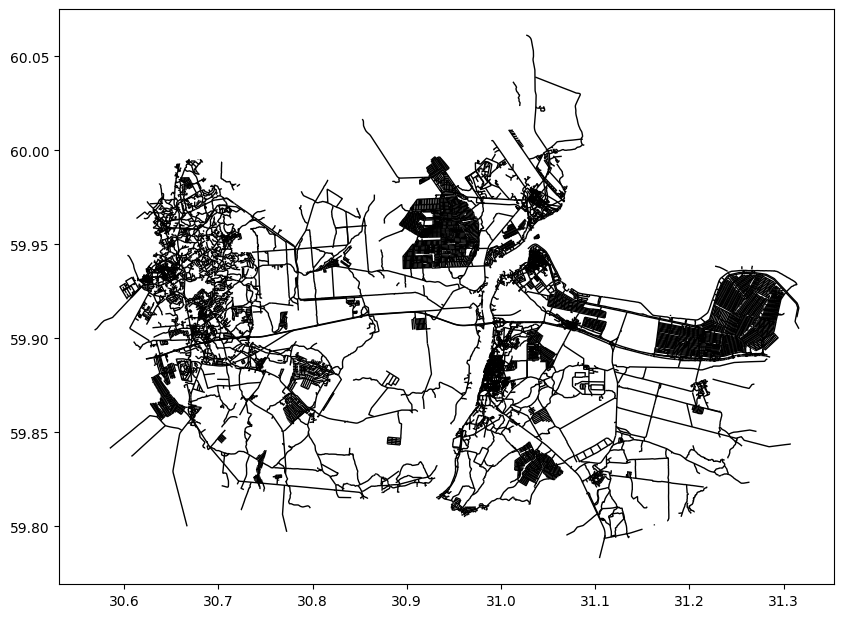

In [6]:
import osmnx as ox
import geopandas as gpd
from shapely.ops import unary_union
import matplotlib.pyplot as plt

# Предполагается, что boundaries_gdf — GeoDataFrame с геометриями
# Проверяем и преобразуем в нужную проекцию (WGS84, EPSG:4326)
boundaries_gdf = boundaries_gdf.to_crs(epsg=4326)

# Проверяем валидность геометрий
if not boundaries_gdf.geometry.is_valid.all():
    boundaries_gdf['geometry'] = boundaries_gdf.geometry.buffer(0)  # Исправляем невалидные геометрии

# Объединяем геометрии в один полигон
polygon = unary_union(boundaries_gdf.geometry)

# Теги для линейных объектов (исключаем точки)
tags = {
    'highway': [
        'motorway', 'trunk', 'primary', 'secondary', 'tertiary', 'unclassified', 'residential',
        'motorway_link', 'trunk_link', 'primary_link', 'secondary_link', 'tertiary_link',
        'living_street', 'service', 'track', 'escape', 'pedestrian', 'path', 'footway',
        'cycleway', 'bridleway', 'steps', 'bus_guideway', 'raceway', 'construction'
    ]
}

# Загружаем геометрии дорог
try:
    roads = ox.features_from_polygon(polygon, tags=tags)
except Exception as e:
    print(f"Ошибка при загрузке данных: {e}")
    roads = gpd.GeoDataFrame()  # Пустой GeoDataFrame на случай ошибки

# Фильтруем только LineString и MultiLineString
roads = roads[roads.geometry.type.isin(['LineString', 'MultiLineString'])]

# Проверяем, что данные получены
if roads.empty:
    print("Линейные объекты не найдены. Проверьте полигон или теги.")
else:
    print(f"Получено {len(roads)} линейных объектов")

# Визуализация
roads.plot(figsize=(10, 10), edgecolor='black', linewidth=1)
plt.show()

roads_gdf = roads.to_crs(crs)
boundaries_gdf = boundaries_gdf.to_crs(crs)

# filt_data

## filt

In [7]:
def find_objects_within_boundary(boundary, 
                                 objects_gdf : gpd.GeoDataFrame):
    within_objects = gpd.sjoin(objects_gdf, 
                              gpd.GeoDataFrame(geometry=[boundary], crs="EPSG:32636"),
                              predicate='within')
    return within_objects

In [8]:
def get_result_blocks(buildings_gdf : gpd.GeoDataFrame,
                       blocks_gdf : gpd.GeoDataFrame, 
                       water_gdf : gpd.GeoDataFrame, 
                       roads_gdf : gpd.GeoDataFrame):
    blocks_sorted = blocks_gdf.copy()
    blocks_sorted['area'] = blocks_sorted.geometry.area
    blocks_sorted = blocks_sorted.sort_values('area', ascending=False)

    results_blocks = []
    for idx, block in blocks_sorted.iterrows():
        boundary_geom = block.geometry
        
        buildings_in_boundary = find_objects_within_boundary(boundary_geom, buildings_gdf)
        water_in_boundary = find_objects_within_boundary(boundary_geom, water_gdf)
        roads_in_boundary = find_objects_within_boundary(boundary_geom, roads_gdf)
        # blocks_in_boundary = find_objects_within_boundary(boundary_geom, blocks_gdf)
        
        result = {
            'block_id': idx,
            'block_geometry': boundary_geom,
            'buildings': buildings_in_boundary,
            'water_objects': water_in_boundary,
            'roads': roads_in_boundary,
            # 'blocks': blocks_in_boundary
        }
        
        results_blocks.append(result)

    return results_blocks

## show

In [9]:
def show_filt_block(block : dict, crs):
    bound_gdf = gpd.GeoDataFrame(geometry=[block['block_geometry']], crs=crs)

    
    m = bound_gdf.explore(
        name="Boundary", 
        color="lightyellow", 
        style_kwds={'fillOpacity': 0.1, 'weight': 3}
    )
    if not block['buildings'].empty:
        buildings_layer = block['buildings'].explore(
            m=m,
            name="Buildings",
            color="darkblue",
            style_kwds={'fillOpacity': 0.5},
            marker_kwds={'radius': 2} if block['buildings'].geometry.type.iloc[0] == 'Point' else None
        )

        
    if not block['water_objects'].empty:
        water_layer = block['water_objects'].explore(
            m=m,
            name="Water",
            color="cyan",
            style_kwds={'fillOpacity': 0.7}
        )

    if not block['roads'].empty:
        roads_layer = block['roads'].explore(
            m=m,
            name="Roads",
            color="grey",
            style_kwds={'weight': 1.5}
        )

    folium.LayerControl().add_to(m)
    display(m)

# clusters

## show

In [10]:
def show_clusters(gdf_clustered):

    explored = gdf_clustered.explore(
        column='cluster',
        cmap='Dark2',
        tiles='OpenStreetMap',
        tooltip=True,
        popup=False,
        legend=True,
        name="Buildings by cluster"
    )

    import folium
    folium.LayerControl().add_to(explored)
    display(explored)

# convex_hull

## show

In [11]:
def show_convex_hulls(hull_gdf : gpd.GeoDataFrame, 
                      clustered_gdf : gpd.GeoDataFrame):
    explored = hull_gdf.explore(
        color="gray",
        tooltip=True,
        popup=False,
        name="Convex Hulls"
    )

    clustered_gdf.explore(
        m=explored,
        column="cluster",
        cmap="Dark2",
        tooltip=True,
        popup=False,
        name="Buildings by cluster"
    )

    folium.LayerControl().add_to(explored)
    display(explored)

# cut

In [12]:
def cut_to_blocks(roads_with_bounds : gpd.GeoDataFrame,
             water_objects : gpd.GeoDataFrame, 
             big_polygon : Polygon):
    
    lines_gdf, polygons_gdf = preprocess_urban_objects(roads_with_bounds, None, water_objects)

    bound_gdf = gpd.GeoDataFrame(geometry=[big_polygon], crs=roads_with_bounds.crs)
    blocks_res = cut_urban_blocks(boundaries_gdf=bound_gdf, lines_gdf=lines_gdf, polygons_gdf=polygons_gdf, fill_holes=False)

    return blocks_res

# classifier

## classify

In [13]:
def classify(blocks : gpd.GeoDataFrame):
    
    classifier = BlocksClassifier()
    blocks_gdf_classified = classifier.evaluate(blocks)
    blocks_gdf_classified['geometry'] = blocks.geometry
    blocks_gdf_classified = gpd.GeoDataFrame(blocks_gdf_classified, geometry=blocks_gdf_classified.geometry, crs=blocks.crs)

    return blocks_gdf_classified

## show

In [14]:
def show_classified_blocks(blocks_gdf_classified : gpd.GeoDataFrame):
    m = blocks_gdf_classified.explore(
        column="category",
        cmap=["red", "yellow", "green"],
        categories=["BlockCategory.INVALID", "BlockCategory.LARGE", "BlockCategory.NORMAL"],
        legend=True,
        tooltip=["category", "probability"],
        popup=True,
        zoom_start=12
    )
    display(m)

# test

In [15]:
res = get_result_blocks(buildings_gdf, blocks_gdf, water_gdf, roads_gdf)
res_0 = res[0]

In [16]:
# res_0 = {
#             'block_id': 1,
#             'block_geometry': unary_union(boundaries_gdf.geometry),
#             'buildings': buildings_gdf,
#             'water_objects': water_gdf,
#             'roads': roads_gdf,
#             # 'blocks': blocks_in_boundary
#         }

In [17]:
show_filt_block(res_0, crs)

In [18]:
clust = clusters(res_0['buildings'])

/root/blocksnet/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/root/blocksnet/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [19]:
show_clusters(clust)

In [20]:
hull_gdf = make_convex_hulls(clust)

In [21]:
show_convex_hulls(hull_gdf, clust)

## extend

In [22]:
new_roads = extend_roads_to_boundary(res_0['roads'], res_0['block_geometry'], cluster_boundaries=hull_gdf)

100%|██████████| 396/396 [00:00<00:00, 601.62it/s]


In [23]:
m = hull_gdf.explore(
    name="Boundary", 
    color="red", 
    style_kwds={'fillOpacity': 0.1, 'weight': 3}
)
if not new_roads.empty:
    buildings_layer = new_roads.explore(
        m=m,
        name="Buildings",
        color="darkblue",
        style_kwds={'fillOpacity': 0.5},
    )

if not res_0['roads'].empty:
    buildings_layer = res_0['roads'].explore(
        m=m,
        name="res_0['roads']",
        color="green",
        style_kwds={'fillOpacity': 0.5},
    )


folium.LayerControl().add_to(m)
display(m)

In [24]:
new_roads['new_geometry'] = new_roads['geometry']
for idx, row in tqdm(new_roads.iterrows(), total=len(new_roads)):
    geom = row['geometry']
    if geom is None or geom.is_empty:
        new_roads.at[idx, 'new_geometry'] = geom 
    else:
        new_roads.at[idx, 'new_geometry'] = new_borderline(geom, res_0['buildings'])

new_roads['geometry'] = new_roads['new_geometry']
new_roads = new_roads.drop(columns=['new_geometry'])

# print("Пустые геометрии после обработки:")
# print(new_roads[new_roads['geometry'].is_empty])

100%|██████████| 778/778 [00:06<00:00, 124.41it/s]


In [25]:
all_roads = gpd.GeoDataFrame(pd.concat([new_roads, res_0['roads']], ignore_index=True), crs=res_0['roads'].crs)

In [26]:
# Извлекаем границы полигонов как LineString
polygon_boundaries = hull_gdf.boundary

# Создаем GeoDataFrame с границами полигонов
boundaries_gdf = gpd.GeoDataFrame(geometry=polygon_boundaries)

# Объединяем GeoDataFrame с линиями и границами полигонов
new_roads_with_bounds = gpd.GeoDataFrame(pd.concat([all_roads, boundaries_gdf, res_0['roads']], ignore_index=True))

# Сбрасываем индекс, если нужно
new_roads_with_bounds = new_roads_with_bounds.reset_index(drop=True)

In [27]:
new_roads_with_bounds = new_roads_with_bounds[['geometry']]

In [28]:
new_roads_with_bounds.explore()

## cut

In [29]:
blocks_res = cut_to_blocks(new_roads_with_bounds, res_0['water_objects'], res_0['block_geometry'])

2025-06-06 14:58:51.072 | INFO     | blocksnet.blocks.cutting.preprocessing.core:preprocess_urban_objects:44 - Checking roads schema
2025-06-06 14:58:51.085 | INFO     | blocksnet.blocks.cutting.preprocessing.core:preprocess_urban_objects:51 - Checking railways schema
2025-06-06 14:58:51.086 | WARNING  | blocksnet.blocks.cutting.preprocessing.core:preprocess_urban_objects:53 - Railways GeoDataFrame is None. Creating empty
2025-06-06 14:58:51.090 | INFO     | blocksnet.blocks.cutting.preprocessing.core:preprocess_urban_objects:58 - Checking water schema
2025-06-06 14:58:51.108 | INFO     | blocksnet.blocks.cutting.processing.core:wrapper:21 - Checking boundaries schema
2025-06-06 14:58:51.119 | INFO     | blocksnet.blocks.cutting.processing.core:wrapper:25 - Checking line objects schema
2025-06-06 14:58:51.140 | INFO     | blocksnet.blocks.cutting.processing.core:wrapper:31 - Checking polygon objects schema
2025-06-06 14:58:51.149 | INFO     | blocksnet.blocks.cutting.processing.core:_e

In [30]:
blocks_res.explore()

In [31]:
blocks_gdf_classified = classify(blocks_res)

2025-06-06 14:58:51.527 | INFO     | blocksnet.preprocessing.feature_engineering.core:_calculate_usual_features:35 - Calculating usual features
2025-06-06 14:58:51.548 | INFO     | blocksnet.preprocessing.feature_engineering.core:_calculate_aspect_ratios:58 - Calculating aspect ratios
100%|██████████| 670/670 [00:00<00:00, 22239.15it/s]
2025-06-06 14:58:51.582 | INFO     | blocksnet.preprocessing.feature_engineering.core:_calculate_centerlines:21 - Calculating centerlines
100%|██████████| 670/670 [00:01<00:00, 462.16it/s]
2025-06-06 14:58:53.053 | INFO     | blocksnet.preprocessing.feature_engineering.core:_generate_combinations:68 - Generating combinations


In [32]:
show_classified_blocks(blocks_gdf_classified)

## merge

In [33]:
combined_gdf = merge_invalid_blocks(blocks_gdf_classified)
combined_gdf = merge_empty_blocks(combined_gdf, res_0["buildings"])
combined_gdf.explore(
    column="category",
    cmap=["red", "yellow", "green"],
    categories=["BlockCategory.INVALID", "BlockCategory.LARGE", "BlockCategory.NORMAL"],
    legend=True,
    tooltip=["category", "probability"],
    popup=True,
    zoom_start=12
)